In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots


import re

import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from datetime import datetime
from statsmodels.tsa.stattools import acf,pacf
from statsmodels.tsa.arima_model import ARIMA

import plotly.express as px

from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

In [93]:
dateparse = lambda dates: pd.datetime.strptime(dates,'%H:%M:%S')
trip1= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip1.CSV',parse_dates=['Time'],date_parser = dateparse)
trip2= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip2.CSV',parse_dates=['Time'],date_parser = dateparse)
trip3= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip3.CSV',parse_dates=['Time'],date_parser = dateparse)
trip5= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip5.CSV',parse_dates=['Time'],date_parser = dateparse)
trip6= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip6.CSV',parse_dates=['Time'],date_parser = dateparse)
trip7= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip7.CSV',parse_dates=['Time'],date_parser = dateparse)
trip8= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip8.CSV',parse_dates=['Time'],date_parser = dateparse)
trip9= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip9.CSV',parse_dates=['Time'],date_parser = dateparse)
trip10= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip10.CSV',parse_dates=['Time'],date_parser = dateparse)
trip11= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip11.CSV',parse_dates=['Time'],date_parser = dateparse)
trip12= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip12.CSV',parse_dates=['Time'],date_parser = dateparse)
trip13= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip13.CSV',parse_dates=['Time'],date_parser = dateparse)
trip14= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip14.CSV',parse_dates=['Time'],date_parser = dateparse)
trip15= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip15.CSV',parse_dates=['Time'],date_parser = dateparse)
trip16= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip16.CSV',parse_dates=['Time'],date_parser = dateparse)
trip17= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip17.CSV',parse_dates=['Time'],date_parser = dateparse)
trip18= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip18.CSV',parse_dates=['Time'],date_parser = dateparse)
trip19= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip19.CSV',parse_dates=['Time'],date_parser = dateparse)
trip20= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip20.CSV',parse_dates=['Time'],date_parser = dateparse)
trip21= pd.read_csv('https://raw.githubusercontent.com/monica-prakash/hiper-data/master/trip21.CSV',parse_dates=['Time'],date_parser = dateparse)

In [94]:
trip1.columns = map(str.lower,trip1.columns)
trip2.columns = map(str.lower,trip2.columns)
trip3.columns = map(str.lower,trip3.columns)
trip5.columns = map(str.lower,trip5.columns)
trip6.columns = map(str.lower,trip6.columns)
trip7.columns = map(str.lower,trip7.columns)
trip8.columns = map(str.lower,trip8.columns)
trip9.columns = map(str.lower,trip9.columns)
trip10.columns = map(str.lower,trip10.columns)
trip11.columns = map(str.lower,trip11.columns)
trip12.columns = map(str.lower,trip12.columns)
trip13.columns = map(str.lower,trip13.columns)
trip14.columns = map(str.lower,trip14.columns)
trip15.columns = map(str.lower,trip15.columns)
trip16.columns = map(str.lower,trip16.columns)
trip17.columns = map(str.lower,trip17.columns)
trip18.columns = map(str.lower,trip18.columns)
trip19.columns = map(str.lower,trip19.columns)
trip20.columns = map(str.lower,trip20.columns)
trip21.columns = map(str.lower,trip21.columns)

In [95]:
data_list  = [trip1,trip2,trip3,trip5,trip6,trip7,trip8,trip9,trip10,trip11,trip12,trip13,trip14,trip15,trip16,trip17,trip18,trip19,trip20,trip21]
column_list = ['rpm','fuel flow rate','rail pressure','maf','bat volt','engine load','iat','brake']
decode_list = ['rpm','tps','fuel flow rate','engine load','rail pressure','map','baro','speed','ect','iat','maf','egr']



In [96]:
trip1['latitude'] = trip1['latitude'].fillna(0)
trip1['longitude'] = trip1['longitude'].fillna(0)

trip2['latitude'] = trip2['latitude'].fillna(0)
trip2['longitude'] = trip2['longitude'].fillna(0)

trip3['latitude'] = trip3['latitude'].fillna(0)
trip3['longitude'] = trip3['longitude'].fillna(0)

trip5['latitude'] = trip5['latitude'].fillna(0)
trip5['longitude'] = trip5['longitude'].fillna(0)
trip5['rpm'] = trip5['rpm'].fillna(0)

trip8['latitude'] = trip8['latitude'].fillna(0)
trip8['longitude'] = trip8['longitude'].fillna(0)
trip8['egr'] = trip8['egr'].fillna(0)
trip8['rpm'] = trip8['rpm'].fillna(0)

trip9['latitude'] = trip9['latitude'].fillna(0)
trip9['longitude'] = trip9['longitude'].fillna(0)

trip10['latitude'] = trip10['latitude'].fillna(0)
trip10['longitude'] = trip10['longitude'].fillna(0)

trip11['latitude'] = trip11['latitude'].fillna(0)
trip11['longitude'] = trip11['longitude'].fillna(0)
trip11['rpm'] = trip11['rpm'].fillna(0)

trip12['latitude'] = trip12['latitude'].fillna(0)
trip12['longitude'] = trip12['longitude'].fillna(0)
trip12['egr'] = trip12['egr'].fillna(0)
trip12['bat volt'] = trip12['bat volt'].fillna(0)

trip13['latitude'] = trip13['latitude'].fillna(0)
trip13['longitude'] = trip13['longitude'].fillna(0)

trip14['latitude'] = trip14['latitude'].fillna(0)
trip14['longitude'] = trip14['longitude'].fillna(0)

trip15['latitude'] = trip15['latitude'].fillna(0)
trip15['longitude'] = trip15['longitude'].fillna(0)

trip16['latitude'] = trip16['latitude'].fillna(0)
trip16['longitude'] = trip16['longitude'].fillna(0)

trip17['latitude'] = trip17['latitude'].fillna(0)
trip17['longitude'] = trip17['longitude'].fillna(0)

trip18['latitude'] = trip18['latitude'].fillna(0)
trip18['longitude'] = trip18['longitude'].fillna(0)

trip19['latitude'] = trip19['latitude'].fillna(0)
trip19['longitude'] = trip19['longitude'].fillna(0)

trip20['latitude'] = trip20['latitude'].fillna(0)
trip20['longitude'] = trip20['longitude'].fillna(0)



trip11['rpm'] = trip11['rpm'].fillna(0)


In [97]:
def remove_scientific(list1):
    temp = list1
    temp.replace('0.00E+00','0e00',inplace=True)
    return temp


In [98]:
for i in data_list:
    for j in column_list:
        i[j] = remove_scientific(i[j])

In [99]:
def decode_rpm(list1):
    temp = list1
    temp = [int(str(i),16)/4 for i in temp.values]
    return temp

def decode_tps_egr(list1):
    temp=list1
    temp = [int(str(i),16)*(100/255) for i in temp.values]
    return temp


def decode_ect_iat(list1):
    temp=list1
    temp = [int(str(i),16)-40 for i in temp.values]
    return temp

def decode_map_baro_speed(list1):
    temp=list1
    temp = [int(str(i),16) for i in temp.values]
    return temp

def decode_maf(list1):
    temp = list1
    temp = [int(str(i),16)/100 for i in temp.values]
    return temp

def decode_rail_pressure(list1):
    temp = list1
    temp = [int(str(i),16)*10 for i in temp.values]
    return temp

def decode_engine_load(list1):
    temp = list1
    temp = [int(str(i),16)/2.55 for i in temp.values]
    return temp

def decode_fuel(list1):
    temp = list1
    temp = [int(str(i),16)/20 for i in temp.values]
    return temp

def decode_brake(list1):
    temp = list1
    temp = [int(str(i),16) for i in temp.values]
    return temp
    
    
    
    

In [100]:
#for i in data_list:
    #i['rpm'] = decode_rpm(i['rpm'])
    

In [101]:
#for i in data_list:
    #i['fuel flow rate'] = decode_fuel(i['fuel flow rate'])

In [102]:
#for i in data_list:
    #i['egr'] = decode_tps_egr(i['egr'])

In [103]:
#for i in data_list:
    #i['engine load'] = decode_engine_load(i['engine load'])



In [104]:
#for i in data_list:
    #i['rail pressure'] = decode_rail_pressure(i['rail pressure'])

In [105]:
#for i in data_list:
    #i['map'] = decode_map_baro_speed(i['map'])

In [106]:
#for i in data_list:
    #i['baro'] = decode_map_baro_speed(i['baro'])

In [107]:
#for i in data_list:
    #i['speed'] = decode_map_baro_speed(i['speed'])

In [108]:
#for i in data_list:
    #i['ect'] = decode_ect_iat(i['ect'])

In [109]:
#for i in data_list:
    #i['iat'] = decode_ect_iat(i['iat'])

In [110]:
#for i in data_list:
    #i['maf'] = decode_maf(i['maf'])


In [111]:
for i in data_list:
    i['brake'] = decode_brake(i['brake'])
    i['maf'] = decode_maf(i['maf'])
    i['iat'] = decode_ect_iat(i['iat'])
    i['ect'] = decode_ect_iat(i['ect'])
    i['speed'] = decode_map_baro_speed(i['speed'])
    i['baro'] = decode_map_baro_speed(i['baro'])
    i['map'] = decode_map_baro_speed(i['map'])
    i['rail pressure'] = decode_rail_pressure(i['rail pressure'])
    i['engine load'] = decode_engine_load(i['engine load'])
    i['egr'] = decode_tps_egr(i['egr'])
    i['fuel flow rate'] = decode_fuel(i['fuel flow rate'])
    i['rpm'] = decode_rpm(i['rpm'])

# Hiper Automotive Fuel Dependency Dashboard

# 1. Amount of fuel consumed at the end of each trip

In [112]:
def calculate_fuel(list1):
    temp = list1
    value = sum(temp.values)/3600
    return value

In [113]:
fuel_consumption = []
for i in data_list:
    fuel = calculate_fuel(i['fuel flow rate'])
    fuel_consumption.append(fuel)

In [114]:
fuel_consumption = [round(i,2) for i in fuel_consumption]

In [115]:
trip_name = ['trip1','trip2','trip3','trip5','trip6','trip7','trip8','trip9','trip10','trip11','trip12','trip13','trip14','trip15','trip16','trip17','trip18','trip19','trip20','trip21']

In [116]:
fuel_data = pd.DataFrame(list(zip(trip_name,fuel_consumption)),columns=['Trip','Fuel Consumed'])

In [117]:
fuel_data

,Trip,Fuel Consumed
0,trip1,5.52
1,trip2,11.75
2,trip3,19.99
3,trip5,32.99
4,trip6,3.05
5,trip7,5.09
6,trip8,1.26
7,trip9,10.88
8,trip10,10.87
9,trip11,2.46


In [118]:
for i in data_list:
    i['time'] = i['time'].dt.time

# Dependency on fuel parameter

In a modern day engine all the sensors play an important role in optimizing the engine performance. Still a few sensors have more and direct influence on the fuel flow into the engine to get the optimal fuel air ratio.

Engine Coolant Temperature(ECT), Throttle Position Sensor(TPS) and Manifold Absolute Pressure (MAP) have direct impact on the fuel flow rate than the other parameters.

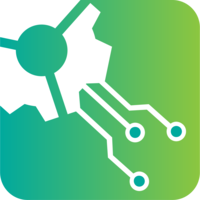

In [140]:
from IPython.display import display
from PIL import Image


#path="C:\Users\monica prakash\Desktop\0.png"
display(Image.open('C:\\Users\\monica prakash\\Desktop\\0.png'))

In [119]:
def cap_data(df):
    for col in df.columns:
        
        if (((df[col].dtype)=='float64') | ((df[col].dtype)=='int64')):
            percentiles = df[col].quantile([0.01,0.99]).values
            df[col][df[col] <= percentiles[0]] = percentiles[0]
            df[col][df[col] >= percentiles[1]] = percentiles[1]
        else:
            df[col]=df[col]
    return df



In [120]:
trip_1 = cap_data(trip1)
trip_2 = cap_data(trip2)
trip_3 = cap_data(trip3)
trip_5 = cap_data(trip5)
trip_6 = cap_data(trip6)
trip_7 = cap_data(trip7)
trip_8 = cap_data(trip8)
trip_9 = cap_data(trip9)
trip_10 = cap_data(trip10)
trip_11 = cap_data(trip11)
trip_12 = cap_data(trip12)
trip_13 = cap_data(trip13)
trip_14 = cap_data(trip14)
trip_15 = cap_data(trip15)
trip_16 = cap_data(trip16)
trip_17 = cap_data(trip17)
trip_18 = cap_data(trip18)
trip_19 = cap_data(trip19)
trip_20 = cap_data(trip20)
trip_21 = cap_data(trip21)


#  Engine Coolant Temperature (ECT)

It decides how rich the fuel mixture has to be based on the engine temperature. The mixture is rich when the engine is cold. A faulty ECT sensor results in considering the engine to be cold always thus fuel mixture is rich always using more fuel than required reducing the fuel economy terribly.

In [147]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip_1['ect']),
                name = "trip1",
                mode = 'markers',  
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip_2['ect']),
                name = "trip2",
                mode='markers',                   
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip_3['ect']),
                name = "trip3",
                mode='markers',                   
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip_5['ect']),
                name = "trip5",
                mode='markers',                   
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip_6['ect']),
                name = "trip6",
                mode='markers',                   
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip_7['ect']),
                name = "trip7",
                mode='markers',                   
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip_8['ect']),
                name = "trip8",
                mode='markers',                   
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip_9['ect']),
                name = "trip9",
                mode='markers',                   
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip_10['ect']),
                name = "trip3",
                mode='markers',                   
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip_11['ect']),
                name = "trip11",
                mode='markers',                   
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip_12['ect']),
                name = "trip12",
                mode='markers',                   
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip_13['ect']),
                name = "trip14",
                mode='markers',                   
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip_14['ect']),
                name = "trip14",
                mode='markers',                   
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip_15['ect']),
                name = "trip15",
                mode='markers',                   
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip_16['ect']),
                name = "trip16",
                mode='markers',                   
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip_17['ect']),
                name = "trip17",
                mode='markers',                   
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip_18['ect']),
                name = "trip18",
                mode='markers',                   
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip_19['ect']),
                name = "trip19",
                mode='markers',                   
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip_20['ect']),
                name = "trip20",
                mode='markers',                   
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip_21['ect']),
                name = "trip21",
                mode='markers',                   
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption "}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption"}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="Engine Coolant Temperature"),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'plotly_dark'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()

# Throttle Position Sensor

The TPS sensor sends the reading of the throttle opening according to which the fuel mixture is produced. A wrong reading results in a lean mixture as correct ratio won't be supplied and the required acceleration won't be produced.

In [148]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip_1['tps']),
                name = "trip1",
                mode = 'markers',
                    
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip_2['tps']),
                name = "trip2",
                mode='markers',
                      
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip_3['tps']),
                name = "trip3",
                mode='markers',
                      
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip_5['tps']),
                name = "trip5",
                mode='markers',
                      
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip_6['tps']),
                name = "trip6",
                mode='markers',
                      
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip_7['tps']),
                name = "trip7",
                mode='markers',
                      marker_color = trip_7['speed']
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip_8['tps']),
                name = "trip8",
                mode='markers',
                      
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip_9['tps']),
                name = "trip9",
                mode='markers',
                      
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip_10['tps']),
                name = "trip3",
                mode='markers',
                       
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip_11['tps']),
                name = "trip11",
                mode='markers',
                       
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip_12['tps']),
                name = "trip12",
                mode='markers',
                       
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip_13['tps']),
                name = "trip14",
                mode='markers',
                       
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip_14['tps']),
                name = "trip14",
                mode='markers',
                       
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip_15['tps']),
                name = "trip15",
                mode='markers', 
                       
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip_16['tps']),
                name = "trip16",
                mode='markers',
                       
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip_17['tps']),
                name = "trip17",
                mode='markers',  
                       
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip_18['tps']),
                name = "trip18",
                mode='markers',
                       
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip_19['tps']),
                name = "trip19",
                mode='markers',
                       
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip_20['tps']),
                name = "trip20",
                mode='markers',
                       
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip_21['tps']),
                name = "trip21",
                mode='markers',
                       
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption"}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption based on Throttle position"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="Throttle position"),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'plotly_dark'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()

# Manifold Absolute Pressure

The MAP sensor measures the pressure inside the intake manifold of the engine and tells the pressure of the air pumped so that the appropriate amount of fuel can be released to get the optimal ratio. If a wrong reading is recorded by the MAP sensor , appropriate amount of fuel won't be supplied to the engine which will result in deteorating the engine performance and thus the fuel economy.

In [149]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip_1['map']),
                name = "trip1",
                mode = 'markers'
                    
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip_2['map']),
                name = "trip2",
                mode='markers'
                      
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip_3['map']),
                name = "trip3",
                mode='markers'
                      
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip_5['map']),
                name = "trip5",
                mode='markers'
                      
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip_6['map']),
                name = "trip6",
                mode='markers'
                      
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip_7['map']),
                name = "trip7",
                mode='markers'
                      
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip_8['map']),
                name = "trip8",
                mode='markers'
                      
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip_9['map']),
                name = "trip9",
                mode='markers'
                      
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip_10['map']),
                name = "trip3",
                mode='markers'
                      
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip_11['map']),
                name = "trip11",
                mode='markers'
                      
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip_12['map']),
                name = "trip12",
                mode='markers'
                      
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip_13['map']),
                name = "trip14",
                mode='markers'
                      
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip_14['map']),
                name = "trip14",
                mode='markers'
                      
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip_15['map']),
                name = "trip15",
                mode='markers' 
                      
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip_16['map']),
                name = "trip16",
                mode='markers'
                      
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip_17['map']),
                name = "trip17",
                mode='markers'  
                      
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip_18['map']),
                name = "trip18",
                mode='markers'
                      
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip_19['map']),
                name = "trip19",
                mode='markers'
                      
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip_20['map']),
                name = "trip20",
                mode='markers'
                      
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip_21['map']),
                name = "trip21",
                mode='markers'
                      
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="Manifold "),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'plotly_dark'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()

# Strategies to increase fuel economy

### 1. Avoid high rpm when the engine is cold as it takes more fuel. Don't take off with high speed.

It can be seen that more fuel is consumed when high speed is applied while the engine is still below the normal temperature (90C).

In [150]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip_1['ect']),
                name = "trip1",
                mode = 'markers',
                    marker_color = trip_1['speed']
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip_2['ect']),
                name = "trip2",
                mode='markers',
                      marker_color = trip_2['speed']
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip_3['ect']),
                name = "trip3",
                mode='markers',
                      marker_color = trip_3['speed']
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip_5['ect']),
                name = "trip5",
                mode='markers',
                      marker_color = trip_5['speed']
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip_6['ect']),
                name = "trip6",
                mode='markers',
                      marker_color = trip_6['speed']
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip_7['ect']),
                name = "trip7",
                mode='markers',
                      marker_color = trip_7['speed']
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip_8['ect']),
                name = "trip8",
                mode='markers',
                      marker_color = trip_8['speed']
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip_9['ect']),
                name = "trip9",
                mode='markers',
                      marker_color = trip_9['speed']
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip_10['ect']),
                name = "trip3",
                mode='markers',
                       marker_color = trip_10['speed']
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip_11['ect']),
                name = "trip11",
                mode='markers',
                       marker_color = trip_11['speed']
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip_12['ect']),
                name = "trip12",
                mode='markers',
                       marker_color = trip_12['speed']
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip_13['ect']),
                name = "trip14",
                mode='markers',
                       marker_color = trip_13['speed']
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip_14['ect']),
                name = "trip14",
                mode='markers',
                       marker_color = trip_14['speed']
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip_15['ect']),
                name = "trip15",
                mode='markers', 
                       marker_color = trip_15['speed']
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip_16['ect']),
                name = "trip16",
                mode='markers',
                       marker_color = trip_16['speed']
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip_17['ect']),
                name = "trip17",
                mode='markers',  
                       marker_color = trip_17['speed']
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip_18['ect']),
                name = "trip18",
                mode='markers',
                       marker_color = trip_18['speed']
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip_19['ect']),
                name = "trip19",
                mode='markers',
                       marker_color = trip_19['speed']
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip_20['ect']),
                name = "trip20",
                mode='markers',
                       marker_color = trip_20['speed']
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip_21['ect']),
                name = "trip21",
                mode='markers',
                       marker_color = trip_21['speed']
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption based on ECT and speed "}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption based on ECT and speed"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="Engine Coolant Temperature"),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'seaborn'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()

### 2. Don't use unnecessary brakes.

You can see that more fuel is consumed even when the brakes are applied at the slightest rate.

In [144]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip1['brake']),
                name = "trip1",
                mode = 'markers',
                    
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip2['brake']),
                name = "trip2",
                mode='markers',
                      
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip3['brake']),
                name = "trip3",
                mode='markers',
                      
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip5['brake']),
                name = "trip5",
                mode='markers',
                      
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip6['brake']),
                name = "trip6",
                mode='markers',
                     
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip7['brake']),
                name = "trip7",
                mode='markers',
                      
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip8['brake']),
                name = "trip8",
                mode='markers',
                      
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip9['brake']),
                name = "trip9",
                mode='markers',
                      
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip10['brake']),
                name = "trip3",
                mode='markers',
                       
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip11['brake']),
                name = "trip11",
                mode='markers',
                       
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip12['brake']),
                name = "trip12",
                mode='markers',
                       
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip13['brake']),
                name = "trip14",
                mode='markers',
                       
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip14['brake']),
                name = "trip14",
                mode='markers',
                       
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip15['brake']),
                name = "trip15",
                mode='markers', 
                       
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip16['brake']),
                name = "trip16",
                mode='markers',
                       
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip17['brake']),
                name = "trip17",
                mode='markers',  
                       
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip18['brake']),
                name = "trip18",
                mode='markers',
                       
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip19['brake']),
                name = "trip19",
                mode='markers',
                       
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip20['brake']),
                name = "trip20",
                mode='markers',
                       
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip21['brake']),
                name = "trip21",
                mode='markers',
                       
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake "}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption based on the application of brake"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="Brake"),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'seaborn'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()

### 3. Maintain a RPM below 3,000

An RPM below 3,000 is seen to consume less fuel thus increasing the fuel economy.

In [151]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip_1['rpm']),
                name = "trip1",
                mode = 'markers'
                    
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip_2['rpm']),
                name = "trip2",
                mode='markers'
                      
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip_3['rpm']),
                name = "trip3",
                mode='markers'
                      
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip_5['rpm']),
                name = "trip5",
                mode='markers'
                      
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip_6['rpm']),
                name = "trip6",
                mode='markers'
                      
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip_7['rpm']),
                name = "trip7",
                mode='markers'
                      
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip_8['rpm']),
                name = "trip8",
                mode='markers'
                      
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip_9['rpm']),
                name = "trip9",
                mode='markers'
                      
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip_10['rpm']),
                name = "trip3",
                mode='markers'
                      
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip_11['rpm']),
                name = "trip11",
                mode='markers'
                      
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip_12['rpm']),
                name = "trip12",
                mode='markers'
                      
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip_13['rpm']),
                name = "trip14",
                mode='markers'
                      
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip_14['rpm']),
                name = "trip14",
                mode='markers'
                      
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip_15['rpm']),
                name = "trip15",
                mode='markers' 
                      
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip_16['rpm']),
                name = "trip16",
                mode='markers'
                      
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip_17['rpm']),
                name = "trip17",
                mode='markers'  
                      
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip_18['rpm']),
                name = "trip18",
                mode='markers'
                      
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip_19['rpm']),
                name = "trip19",
                mode='markers'
                      
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip_20['rpm']),
                name = "trip20",
                mode='markers'
                      
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip_21['rpm']),
                name = "trip21",
                mode='markers'
                      
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM "}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption based on RPM"}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption based on RPM"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="RPM"),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'seaborn'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()

### 4. A speed of 55-65 mph is seen to give best fuel economy. 

In [152]:
trace1 = go.Scatter(x = list(trip_1['fuel flow rate']),
                y = list(trip_1['speed']),
                name = "trip1",
                mode = 'markers'
                    
                 )

trace2 =  go.Scatter(x = list(trip_2['fuel flow rate']),
                y = list(trip_2['speed']),
                name = "trip2",
                mode='markers'
                      
                 )

trace3 =  go.Scatter(x = list(trip_3['fuel flow rate']),
                y = list(trip_3['speed']),
                name = "trip3",
                mode='markers'
                      
                 )


trace5 =  go.Scatter(x = list(trip_5['fuel flow rate']),
                y = list(trip_5['speed']),
                name = "trip5",
                mode='markers'
                      
                 )


trace6 =  go.Scatter(x = list(trip_6['fuel flow rate']),
                y = list(trip_6['speed']),
                name = "trip6",
                mode='markers'
                      
                 )


trace7 =  go.Scatter(x = list(trip_7['fuel flow rate']),
                y = list(trip_7['speed']),
                name = "trip7",
                mode='markers'
                      
                 )


trace8 =  go.Scatter(x = list(trip_8['fuel flow rate']),
                y = list(trip_8['speed']),
                name = "trip8",
                mode='markers'
                      
                 )


trace9 =  go.Scatter(x = list(trip_9['fuel flow rate']),
                y = list(trip_9['speed']),
                name = "trip9",
                mode='markers'
                      
                 )


trace10 =  go.Scatter(x = list(trip_10['fuel flow rate']),
                y = list(trip_10['speed']),
                name = "trip3",
                mode='markers'
                      
                 )


trace11 =  go.Scatter(x = list(trip_11['fuel flow rate']),
                y = list(trip_11['speed']),
                name = "trip11",
                mode='markers'
                      
                 )


trace12 =  go.Scatter(x = list(trip_12['fuel flow rate']),
                y = list(trip_12['speed']),
                name = "trip12",
                mode='markers'
                      
                 )


trace13 =  go.Scatter(x = list(trip_13['fuel flow rate']),
                y = list(trip_13['speed']),
                name = "trip14",
                mode='markers'
                      
                 )


trace14 =  go.Scatter(x = list(trip_14['fuel flow rate']),
                y = list(trip_14['speed']),
                name = "trip14",
                mode='markers'
                      
                 )


trace15 =  go.Scatter(x = list(trip_15['fuel flow rate']),
                y = list(trip_15['speed']),
                name = "trip15",
                mode='markers' 
                      
                 )


trace16 =  go.Scatter(x = list(trip_16['fuel flow rate']),
                y = list(trip_16['speed']),
                name = "trip16",
                mode='markers'
                      
                 )


trace17 =  go.Scatter(x = list(trip_17['fuel flow rate']),
                y = list(trip_17['speed']),
                name = "trip17",
                mode='markers'  
                      
                 )


trace18 =  go.Scatter(x = list(trip_18['fuel flow rate']),
                y = list(trip_18['speed']),
                name = "trip18",
                mode='markers'
                      
                 )


trace19 =  go.Scatter(x = list(trip_19['fuel flow rate']),
                y = list(trip_19['speed']),
                name = "trip19",
                mode='markers'
                      
                 )


trace20 =  go.Scatter(x = list(trip_20['fuel flow rate']),
                y = list(trip_20['speed']),
                name = "trip20",
                mode='markers'
                      
                 )


trace21 =  go.Scatter(x = list(trip_21['fuel flow rate']),
                y = list(trip_21['speed']),
                name = "trip21",
                mode='markers'
                      
                 )


data1 = [trace1,trace2,trace3,trace5,trace6,trace7,trace8,trace9,trace10,trace11,trace12,trace13,trace14,trace15,trace16,
        trace17,trace18,trace19,trace20,trace21]





updatemenus = list([
    dict(active=-1,
         buttons=list([   
            dict(label = "trip1",
                 method = "update",
                 #the visible parameters correspond to the traces. for eg to display in city the first
                 #trace has to be considered , so the first parameter is true
                 args = [{"visible": [True, False,False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed "}]),
            dict(label = "trip2",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, True,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
             
             dict(label = "trip3",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip5",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,True,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip6",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,True,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip7",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,True,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip8",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,True,False,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip9",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,True,False,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip10",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,True,False,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip11",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,True,False,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip12",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,True,
                                     False,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip13",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     True,False,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip14",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,True,False,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip15",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,True,False,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip16",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,True,False,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip17",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,True,False,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip18",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,True,False,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip19",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,True,False,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
               dict(label = "trip20",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,True,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,True,False]},
                         {"title": "Fuel Consumption based on Speed"}]),
             
              dict(label = "trip21",
                 method = "update",
                 #for highway the second trace has to be considered so the second one is true
                 args = [{"visible": [False, False,False,False,False,False,False,False,False,False,False,
                                     False,False,False,False,False,False,False,False,True]},
                         {"title": "Fuel Consumption based on Speed"}]),
       
             
                   ]),
    )
])

layout = go.Layout(title="Dropdown",
              showlegend=False,
              xaxis=dict(title="fuel flow rate"),
              yaxis=dict(title="Speed"),
              updatemenus=updatemenus
              )
fig = go.Figure(data=data1,layout=layout)

template = 'seaborn'
fig.update_layout(template=template, title="fuel consumption (select the required trip from the drop down) ")

# Plot the plotly plot
fig.show()